# Analysis of (Su0)Vs1Xn
```
Analysis / figures of results from h_DsRnn_Prep_spa.ipynb
Summarizing mult. RNNs / data sets based on Pandas ExTb and ProcTb.

PREC: h_DsRnnAna_Pd.ipynb, h_DsRnnAnaPd_Su1Vx7_v1b.ipynb
SEE ALSO: h_DsRnnAna_v6b2.ipynb
```
Analyse the missing-channel data (Xn0).

##### SEE ALSO: [h_DsRnnAna_v6b2.ipynb](./h_DsRnnAna_v6b2_sba.ipynb#Fig_Xnul)


```
jupyter nbconvert --TemplateExporter.exclude_raw=True --TemplateExporter.exclude_input=True --to html --output tmp h_DsRnnAnaPd_Su1Vx7.ipynb

jupyter nbconvert h_DsRnnAnaPd_Su1Vx7.ipynb \
--to html \
--output tmp \
--TemplateExporter.exclude_raw=True \
--TemplateExporter.exclude_input=True \
--TagRemovePreprocessor.remove_cell_tags="{'rmCell'}" \
--TagRemovePreprocessor.remove_all_outputs_tags="{'rmOut'}" \
--RegexRemovePreprocessor.patterns="[r'(?ms).*DeprecationWarning.*']" \
--RegexRemovePreprocessor.patterns="[r'(?ms)Using TensorFlow.*']" \
```

Add this cell metadata (JSON) e.g: `{ "tags": ["rmOut"]}`

# Imports

In [1]:
%run h_DsRnn_def.ipynb

[NbConvertApp] Converting notebook htools_v1b.ipynb to python
[NbConvertApp] Writing 34998 bytes to htools_v1b.py


   h_DsRnn_def.ipynb:15


In [2]:
import pandas as pd
import seaborn as sns
%matplotlib inline
# rcPar = mpl.rcParamsDefault
rcPar = dict(mpl.rcParams) # special for %matplotlib inline!
hplotstyles = lambda : [ plt.style.use('seaborn-talk'), mpl.rcParams.update({'figure.figsize': (18,4)}) ];
# %matplotlib notebook
plt.style.use('default') # necessary reset?
hplotstyles();
# plt.style.use('seaborn-talk') # 'default', 'dark_background', 'seaborn-talk'


# ProcTb: Load model parameter sets

In [3]:
### Create ProcTb - Need this?
%run h_DsRnn_ProcTb.ipynb
# ProcTb = ProcTb.filter(like='Su1Vx7')
ProcTb.shape


(38, 471)

## [ Load ExTb - need this? ]


## Load models / ProcDirs

In [4]:
# cd /data/mandelkowhc/Sleep/0401_Proc05_8su_Ap3
os.chdir(ProcTb.iloc[:,1].DataDir)
# os.chdir(ProcTb.iloc[:,1].DataDir+'Proc06/') # FIXIT: Not using ProcDir
!pwd

/gpfs/gsfs8/users/mandelkowhc/Sleep/0401_Proc05_8su_Ap3


In [5]:
### Show available Proc_Km_*
hsys('find Proc* -type d -iname "Proc_Km*"')

['Proc/Proc_Km_Su0Vs1Lxy',
 'Proc/Proc_Km_Su1Vx7Lxy',
 'Proc06/Proc_Km_Su0Vr1Xn',
 'Proc06/Proc_Km_Su1Vx7Rper',
 'Proc06/Proc_Km_Su1Vf20Xn',
 'Proc06/Proc_Km_Su1Vx7',
 'Proc06/Proc_Km_Su0Vs1Rx2',
 'Proc06/Proc_Km_Su0Vs1Xn',
 'Proc06/Proc_Km_Su0Vs1',
 'Proc06/Proc_Km_Su0Vs1Rper',
 'Proc06/Proc_Km_Su1Vr1Xn',
 'Proc06/Proc_Km_Su0Vs1Rs30Rx1s',
 'Proc06/Proc_Km_Su0Vs1Rx1',
 'Proc06/Proc_Km_Su1Vx7Drop',
 'Proc06/Proc_Km_Su0Vf20Xn',
 'Proc_RnnPar/Proc_Km_Su1Vr3lin',
 'Proc_RnnPar/Proc_Km_Su1Vr3linTbat8',
 'Proc_RnnPar/Proc_Km_Su1Vr3',
 'Proc_RnnPar/Proc_Km_Su1Vr3linNt30',
 'Proc_TVdata/Proc_Km_Su0Vs1Xn0',
 'Proc_TVdata/Proc_Km_Su1Vf20']

In [6]:
Fname = hsys('find Proc*/Proc_Km_Su0Vs1Xn/ -iname "EvalData.mat"')
# Fname = hsys('find Proc*/Proc_Km_Su0Vr1Xn/ -iname "EvalData.mat"')
# Fname = hsys('find Proc*/*/Km_Su0Vf20Xn* -iname "EvalData.mat"') # ***
# Fname = hsys('find Proc*/*/Km_Su1Vf20Xn* -iname "EvalData.mat"') # ***
#< Fname = sorted( Fname, key=os.path.getctime, reverse=False) # sort by time?
Fname = list(map(hFpath,Fname))
len(Fname)
#Fname


32

In [7]:
### Filter Fname by ProcId
ProcId = ('','Vx1','Vs1','Su1Vxn','D1Su1Vxn','Su0Vs1','Su1Vx7_','Su1Vx7Drop_','Vs1Xn','Vx1Xn')[0]
# ProcId = ('Su1Vr3_','Su1Vr3lin_','Su1Vr3')[0]
# Fname = hsys('find Km_%s_*/ -iname "EvalData.mat"'%ProcId ) # Vs1
if ProcId: Fname = [ n for n in Fname if ProcId in n]
# if ProcId: Fname = filter(lambda x: ProcId in x, Fname)

In [8]:
Fname = list(map(hFpath,Fname))
Fname = sorted(Fname)
assert len(Fname), 'Oops! No files?!'
print( '\n'.join( Fname[:8])+'\n... total %u'%len(Fname))

Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu003Xn0/
Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu006Xn0/
Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu056Xn0/
Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu063Xn0/
Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu065Xn0/
Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu078Xn0/
Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu086Xn0/
Proc06/Proc_Km_Su0Vs1Xn/Km_Su0Vs1Xn0_DropLast50vVsu105Xn0/
... total 32


In [9]:
%%time
Pars = hLoadProcDir( Fname)

................................CPU times: user 4.42 s, sys: 7.88 s, total: 12.3 s
Wall time: 19.8 s


## Convert Pars to Pandas (ProcTb or SecTb)

## Check training success

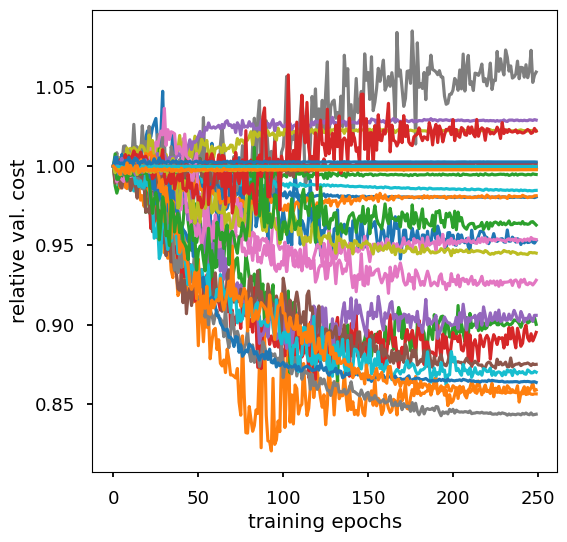

In [10]:
### Fig: Su0Vs1+Rper_TrainLog
hylimmax = lambda x=(0.5,1.5): plt.ylim( max(plt.ylim()[0],x[0]),min(plt.ylim()[1],x[1]) )

fig,ax = plt.subplots(1,1, figsize=(6,6))
for n in range(len(Pars)):
    x = Pars[n]['TrainLog']['val_loss']
    plt.plot( x/x[0] )

ax.set(xlabel='training epochs',ylabel='relative val. cost')

# plt.ylim(0.5,1.5)
hylimmax((0.5,1.5))
if len(Pars)<9: plt.legend(range(len(Pars)));

In [11]:
### Comp Pars[n]['TrainingMetric'] and ['BestValEpoch']
for par in Pars:
    tmp = par['TrainLog'].val_loss.values
    n = tmp.argmin()
    # par['TrainMetric'] = ( tmp[n] - tmp[0] ) / np.diff(tmp[:n]).std()
    par['TrainMetric'] = tmp[n]/tmp[0]
    par['BestValEpoch'] = n
    # print('%u \t%f'%(n,par['TrainMetric']))


['Su0Vs1Xn0', 'Su0Vs1Xn1', 'Su0Vs1Xn2', 'Su0Vs1Xn3']


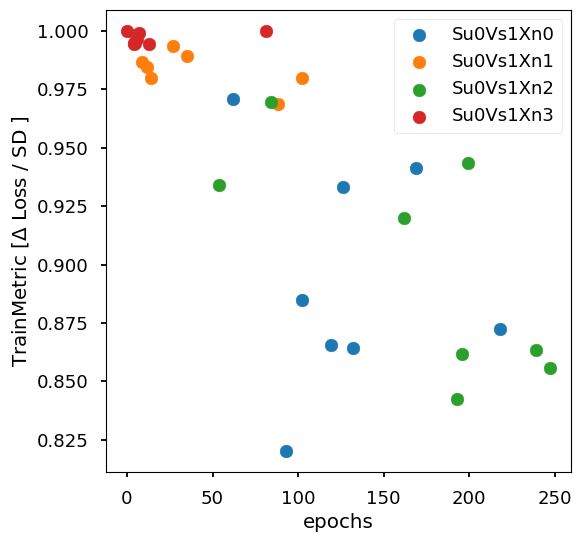

In [12]:
### Fig: Su0Vs1+Rper_ScatTrainMetricEpoch
# tmp = np.array( [ (par['BestValEpoch'], par['TrainMetric'], int(par['ProcId'][-1]) ) for par in Pars])
# tmp = np.array( [ (par['BestValEpoch'], par['TrainMetric'], par['ProcId'].split('_')[0] ) for par in Pars])
m = sorted( list(set( [par['ProcId'].split('_')[0] for par in Pars] )))
print(m)
tmp = np.array( [ (par['BestValEpoch'], par['TrainMetric'], m.index(par['ProcId'].split('_')[0]) ) for par in Pars])

fig,ax = plt.subplots(1,1,figsize=(6,6))
# plt.scatter(tmp[:,0],tmp[:,1],c=tmp[:,2]); # does not support legend!
[ plt.scatter(tmp[ tmp[:,2]==n,0], tmp[ tmp[:,2]==n,1]) for n in np.unique(tmp[:,2])];
# plt.plot(tmp[:,0],tmp[:,1],ls='None',marker='o');
plt.ylabel('TrainMetric [$\Delta$ Loss / SD ]');
plt.xlabel('epochs');
# plt.legend(['Xn'+str(n) for n in range(4)]);
plt.legend(m);


-------------------------------------
### Compare training success across model parameters (ProcGroups)
#### Notes:
 * Su1Vr3 and Su1Vr3lin show little difference in average TrainMetric
   * ...except for 3 neg. outliers (better) in the former.

In [13]:
Tb = pd.DataFrame( Pars, columns=['ProcId','TrainMetric','BestValEpoch']) #.set_index('ProcId',drop=False)
Tb[['ProcGroup','ProcId']] = Tb.ProcId.str.split('_',1,expand=True)
#< 'Vs1'+Tb.ProcId.str.extract(r'(Xn\d)$')
# Tb['ProcGroup'] = Tb.ProcGroup + Tb.ProcId.str.extract(r'Xn(\d)$')
#Tb['ProcGroup'] = Tb.ProcGroup + Tb.ProcId.str.extract(r'Xn_.*Xn(\d)$')
Tb = Tb.set_index(['ProcGroup','ProcId'])


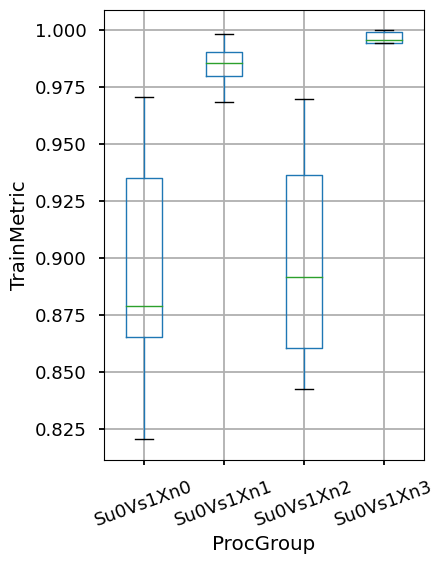

In [14]:
# HOWTO Pandas boxplot - by=boxes, column=axes
Tb.boxplot(column='TrainMetric', by='ProcGroup', figsize=(4,6), rot=20);
plt.suptitle(None); plt.title(None); plt.ylabel('TrainMetric');
# plt.ylim(-10,0)
# Tb.get_loc( Tb.TrainMetric < 10 )
# Tb[ Tb.TrainMetric < -10 ] 


## Make Xarray from Pars (~SecTb)
[Scratch](#Scratch)

In [15]:
## Make a MultiIndex for Su*Sec
import xarray as xr

idx = [ ( par['SuId'], n) for par in Pars for n in range(par['x'].shape[0]) ]
idx = pd.MultiIndex.from_tuples(idx,names=['Su','Sc'])

Data = np.concatenate( [ np.concatenate([par['x'],par['y'],par['yh']],-1) for par in Pars ], 0 )
Data = xr.DataArray( Data, dims=['Sec','t','Ch'], \
                    coords={'Ch':['card','resp','mask','Gsig','y','yh'], 'Sec':idx})

Data.shape
# Data.coords

(4332, 4800, 6)

In [16]:
ValTag = [ par['ValTag'] for par in Pars ] # TODO: store in Par?
assert 1 == len( np.unique(ValTag)), 'Oops! Multiple ValTag numbers!?'

In [17]:
idx = pd.DataFrame()
for par in Pars:
    tmp = pd.DataFrame( par['SecNp'], columns=['Su','Se','Ex','Sc','Vt'] )
    # tmp['ValTag'] = par['ValTag']
    # tmp = tmp[ tmp.Vt==par['ValTag'] ]
    if par['ValFrac']:
        tmp.Vt = tmp.Vt.apply( lambda x: np.where( x<1, x>=(1-par['ValFrac']), x ))
        tmp.Vt = tmp.Vt.astype(int)

    tmp = tmp[ np.any( np.c_[tmp.Vt.values] == np.r_[par['ValTag']],-1) ]
    tmp = tmp.drop(columns='Vt')
    tmp['ProcGrp'] = par['ProcId'].split('_')[0]
    #< tmp['ProcGrp'] += par['ProcId'][-1]
    idx = idx.append(tmp)

idx = idx.astype(int,errors='ignore')
idx = pd.MultiIndex.from_frame( idx )
# idx = idx.remove_unused_levels() # useless!
if idx.levshape[-1]<2 : idx = idx.droplevel(-1)



In [18]:
# Data = xr.DataArray( Data, dims=['Sec','t','Ch'], coords={'Ch':['card','resp','mask','Gsig','y','yh'], 'Sec':idx})
Data.coords['Sec'] = idx; # This should work
Data.coords['t'] = np.arange(Data.sizes['t'])/20;

In [19]:
abs(Data).max(axis=(0,1)) # global max for each channel
tmp = abs(Data).max('t') >= abs(Data).max(['Sec','t'])*0.95 # which sections reach max...
tmp = np.abs(Data).max('t') > 4.01 # which sections reach max...
tmp = tmp[...,:2].any(axis=-1) # ...in any chan.

# HOWTO use Xarray assign_coords
Data = Data.assign_coords(Clipped=tmp) # mark maxes chans in coord. Clipped


In [20]:
Data.coords

Coordinates:
  * Ch       (Ch) <U4 'card' 'resp' 'mask' 'Gsig' 'y' 'yh'
  * Sec      (Sec) MultiIndex
  - Su       (Sec) int64 3 3 3 3 3 3 3 3 3 ... 105 105 105 105 105 105 105 105
  - Se       (Sec) int64 2 2 2 2 2 2 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1 1 1 1
  - Ex       (Sec) int64 12 12 12 12 12 12 7 7 7 ... 10 10 10 10 10 10 10 10 10
  - Sc       (Sec) int64 0 1 2 3 4 5 0 1 2 3 4 ... 17 18 19 20 21 22 23 24 25 26
  - ProcGrp  (Sec) object 'Su0Vs1Xn0' 'Su0Vs1Xn0' ... 'Su0Vs1Xn3' 'Su0Vs1Xn3'
  * t        (t) float64 0.0 0.05 0.1 0.15 0.2 ... 239.8 239.8 239.8 239.9 239.9
    Clipped  (Sec) bool True False False True False ... False False False False

In [21]:
# HOWTO use multi-dim boolean index on xarray - apply to np.array!
# Data.values[Data[:,:,-2]==0,-2] = np.nan # +++
Data.values[:,np.all( Data[:,:,-2]==0, 0),-2] = np.nan # +++
# Data.values[ np.roll( Data.loc[:,:,'mask'].values==0, -1, -1), -2] = np.nan # +++


In [22]:
# HOWTO set Matplotlib default font size:

# mpl.rcParams.update({'font.size': 12})
# plt.rc('axes', titlesize=SMALL_SIZE, labelsize=MEDIUM_SIZE)
# mpl.rcParams.update({'axes.labelsize': 16})
# mpl.rcParams.update({'axes.titlesize': 16})
# plt.rcParams.update({'axes.labelsize': 'large'})
# plt.rcParams.update({'axes.titlesize': 'large'})

*****************************************

************************************************************
# Compute Metrics

In [23]:
# NOTE: Must mask zeros for plotting AND compute par['WRVF']

# NOTE: RVF favors sections that have higher var in y.
hnanrvf = lambda y,yh,dim: np.nanvar( yh-y, dim) / np.nanvar( y, dim)
# hnanrvf = lambda y,yh,dim: np.nanmean( np.abs(yh-y)**2, dim) / np.nanvar( y, dim)


In [24]:
hnormv = lambda X,d=0: X / np.sqrt(np.nansum(np.abs(X)**2,d,keepdims=True)) # +++
# n = np.any( ~np.isnan(Data.loc[:,:,'y'].values), 0)
# hscalez(Data.loc[:,:,'y'].values[:,n],1) * hscalez(Data.loc[:,:,'yh'].values[:,n],1)
n = np.all( ~np.isnan(Data.values[:,:,-2]), 0)
tmp = np.prod( hscalez( Data.values[:,n,-2:], -2), -1).sum(-1)
#< hpcorr = lambda X: np.prod( hscalez( X[..., np.all(~np.any(np.isnan(X),-1), 0:-2), :], -2), -1).sum(-2)
hpcorr = lambda X: np.nansum( np.prod( hnormv( np.where(np.any(np.isnan(X),-1,keepdims=True),np.nan,X), -2), -1), -1) # +++
#< hrcoef = lambda X: np.nansum( X[:,:,-2] * hnormv( np.where(np.any(np.isnan(X),-1),np.nan,X[:,:,-1]), -2), -1) # +++
hrcoef = lambda X,Y: np.nansum( Y * hnormv( np.where(np.isnan(Y),np.nan,X), -1), -1) # +++
# tmp = hpcorr(Data.values[:,:,-2:])
# plt.plot(tmp)


In [25]:
def hnancorr(X,Y,d,ddof=None):
    X = np.where(np.isnan(Y),np.nan,X)
    Y = np.where(np.isnan(X),np.nan,Y)
    X -= np.nanmean(X,d,keepdims=True)
    Y -= np.nanmean(Y,d,keepdims=True)
    X /= np.sqrt(np.nansum(X**2,d,keepdims=True))
    Y /= np.sqrt(np.nansum(Y**2,d,keepdims=True))
    if ddof:
        return np.nanmean(X*Y,d)*(X.shape[d]-ddof)
    return np.nansum(X*Y,d)

hpcorr = lambda X: hnancorr( X[...,-1], X[...,-2], -1)


In [26]:
# HOWTO assign a new attribute var to an Xarray.DataArray
# Data.assign_attrs(wrvf=tmp)

# HOWTO convert Xarray.DataArray to Dataset
# Data = Data.to_dataset(name='Sig')

tmp = hnanrvf( Data[:,:,-2], Data[:,:,-1], -1)
# HOWTO assign a new "coordinate" var to an Xarray.DataArray
Data['WRVF'] = ('Sec',tmp)

n = Data.shape[-2]//2 - 60
tmp = hnanrvf( Data[:,:n,-2], Data[:,:n,-1],-1)
Data['WRVFa'] = ('Sec',tmp)
tmp = hnanrvf( Data[:,-n:,-2], Data[:,-n:,-1],-1)
Data['WRVFz'] = ('Sec',tmp)

Data.attrs['SortBy'] = ('WRVFz', True) # +++ ( coord, ascending=True)


In [27]:
n = Data.shape[-2]//2 - 60
#< tmp = ( 100 - hpcorr( Data[:,-n:,-2:] ) * 100).round(0)
# tmp = hpcorr( Data[:,-n:,-2:] ).round(3)
tmp = hnancorr( Data[:,-n:,-1].values, Data[:,-n:,-2].values, -1 ).round(3)
Data['Pcorr'] = ('Sec',tmp)

#Data.attrs['SortBy'] = ('Pcorr', False) # +++


   /usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:6


In [28]:
n = Data.shape[-2]//2 - 60
#< tmp = ( 100 - hpcorr( Data[:,-n:,-2:] ) * 100).round(0)
tmp = hrcoef( Data[:,-n:,-1], Data[:,-n:,-2] )
Data['Rcoef'] = ('Sec',tmp.round(3))
#Data.attrs['SortBy'] = ('Rcoef', False) # +++


In [29]:
# HOWTO sort Xarray by 
# Data = Data.sortby('WRVFz') # +++
Data.attrs['SortBy'] = ('WRVFz', True) # +++
#Data.attrs['SortBy'] = ('Pcorr', False) # +++
#Data.attrs['SortBy'] = ('Rcoef', False) # +++
#Data = Data.sortby( *Data.attrs['SortBy'] ) # +++


In [30]:
#< Data['WRVFz'] = Data.WRVFz.round(3)
# Data['WRVFz'] = Data.WRVFz.round(3).values
#Data.WRVFz = Data.coords.WRVFz.round(3)
#Data.coords['WRVFz']
Data[Data.attrs['SortBy'][0]][:16].values

array([0.875, 1.181, 0.893, 0.764, 1.257, 0.77 , 0.947, 0.942, 0.848,
       0.734, 0.811, 0.87 , 0.838, 1.008, 0.84 , 0.952], dtype=float32)

*******************************
# Boxplot Metric stats

## Compare different ProcGroups if available

In [31]:
ProcId = Pars[0]['ProcId'].split('_')[0][:-1]

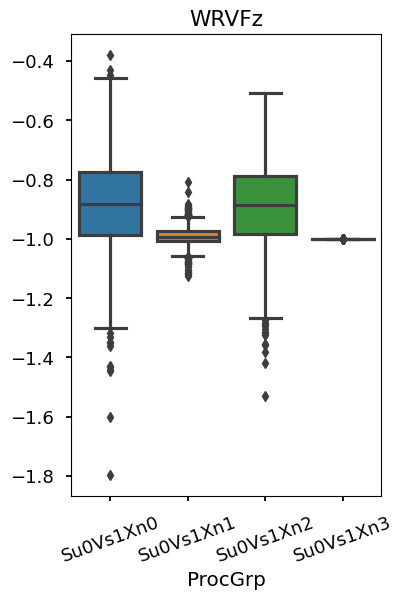

In [32]:
### [++-] Fig: Boxplots Su by Metrics
# HOWTO distribute Seaborn boxplots across mult axes:
tmp = pd.DataFrame.from_dict( { n:Data.coords[n] for n in ['Su','Se','Ex','Sc','ProcGrp','WRVFz','Pcorr','Rcoef'] } )
tmp.WRVFz = -tmp.WRVFz

#< tmp = tmp.set_index(['Su','Se','Ex','Sc','ProcGrp'])

# plt.style.use('default') # necessary reset?
fig,ax = plt.subplots(1,1,figsize=(4,6))
# HOWTO adjust axes spacing:
# plt.subplots_adjust(wspace=0.6)
# for n,m in enumerate(['WRVFz','Pcorr','Rcoef']):
#    sns.boxplot( data=tmp.reset_index(), y=m, ax=ax[n], whis=0 ).set(ylabel=None, xlabel=m)

m = ('WRVFz','Pcorr','Rcoef')[0] # not much difference!?!
sns.boxplot( data=tmp.reset_index(), y=m, x='ProcGrp' ).set(ylabel=None, title=m)
# sns.boxplot( data=tmp[tmp.Su==86].reset_index(), y='WRVFz', x='ProcGrp') #.set(ylabel=None, xlabel=m)
plt.setp(ax.get_xticklabels(), rotation=20);

# hsavefig(ProcId+'_BoxWrvfzXn.png')


# Plot best signals

-----------------------------------------------------
## New Fig: Xn
Technical note: One level of the multiindex Sec is converted into a new separate (leading) dim by first converting DataArray to DataSet (unstack MI level) and then back to DataArray (stack DS variables). As a result the Xn=0..3 can be accessed by integer indices in hFigXn03.

In [33]:
Data = Data.sortby('Sec') # need this?
tmp = Data.sortby('Sec').drop_vars(['WRVF','WRVFa','WRVFz','Pcorr','Rcoef','Clipped'])
# HOWTO convert xr.DataArray to xr.DataSet by turning one level (ProcGrp) of multiindex (Sec) into separate variables.
tmp = tmp.to_unstacked_dataset('Sec','ProcGrp') # xr.DataArray (Multiindex,Level) -> xr.DataSet variables
#tmp.assign_coords(WRVFz=Data.sel(ProcGrp='Su0Vs1Xn0').WRVFz)
# HOWTO cp all .coords from DataArray to (unstacked) DataSet:
# tmp = tmp.assign_coords(Data.sel(ProcGrp='Su0Vs1Xn0').coords)
tmpGrp = np.unique(Data.ProcGrp)
try:
    tmp = tmp.assign_coords(Data.sel(ProcGrp=tmpGrp[0]).coords)
    # tmp = tmp.assign_coords(Data.sel(ProcGrp=tmpGrp[1]).coords)
except:
    print('+++ Ouch! This usually means ProcGrp(s) of different size (Sec).')
    raise # rethrow error

# HOWTO convert xr.DataSet into xr.DataArray by stacking variables in new dimension (Xn)...
# ...and replace the var.names by ints.
tmp = tmp.to_array('Xn')
# tmp['Xn'] = np.arange(tmp.Xn.size)
tmp['Xn'] = np.argsort(tmp.Xn)

In [34]:
tmp = tmp.sortby('WRVFz')
tmp = tmp.isel(Sec=tmp.Clipped==False)
# tmp = tmp.reset_coords('Clipped',drop=True) # delete coord. Clipped
tmp = tmp.drop_vars('Clipped') # OK!
tmp = tmp.drop_vars(['WRVF','WRVFa']) # OK!
for n in ['WRVFz','Pcorr','Rcoef']:
    tmp[n] = tmp[n].round(2)

# tmp.coords


In [35]:
### [++-] Fig: one axes, top metric
def hFigXn03(X): # ver.2b
    for n in range(X.shape[1]):
        fig,ax = plt.subplots(5,1,figsize=(18,6))
        h = X[0][n,:,:2].plot.line(x='t',ax=ax[0]);
        ax[0].set_ylabel('')
        ax[0].set( title='Sec=%s, Vf=%.0f%%, R=%.0f%%'%( \
           str(X[0].Sec[n].values), X[0].WRVFz[n]*100, X[0].Pcorr[n]*100))
        #[ h[n].set_color(('tab:red','tab:blue')[n]) for n in range(2) ]

        for m in range(4):
            h = X[m][n,:,-2:].plot.line(x='t',ax=ax[m+1],add_legend=False);
            plt.setp(h[-2],'marker','o','ls','None','color','r');
            plt.setp(h[-1],'color',('m','tab:blue','tab:red','tab:grey')[m]);
            ax[m+1].set_ylabel(('M+C+R','M+R','M+C','M')[m])
            #> ax[m+1].set(title='')
            #plt.legend([ n.get_label() for n in h]) # Why this don't work?!?
            #plt.legend(Data.coords['Ch'].values[[0,1,-2,-1]]);

        plt.setp(ax[1:],'title','')
        plt.setp(ax[:-1],'xticklabels',[])
        [ n.spines[m].set_visible(False) for n in ax for m in ('top','right')];


In [36]:
### [++-] Fig: one axes, top metric
def hFigXn03dif(X): # ver.2b
    for n in range(X.shape[1]):
        fig,ax = plt.subplots(4,1,figsize=(18,6))
        h = X[0][n,:,:2].plot.line(x='t',ax=ax[0]);
        ax[0].set_ylabel('')
        #[ h[n].set_color(('tab:red','tab:blue')[n]) for n in range(2) ]

        for m in range(X.shape[0]-1):
            #< h = X[m][n,:,-2:].plot.line(x='t',ax=ax[m+1],add_legend=False);
            h = (X[m][n,:,-2:]-X[-1][n,:,-1]).plot.line(x='t',ax=ax[m+1],add_legend=False);
            plt.setp(h[-2],'marker','o','ls','None','color','r');
            plt.setp(h[-1],'color',('m','tab:blue','tab:red','tab:grey')[m]);
            ax[m+1].set_ylabel(('C+R-M','R-M','C-M','M')[m])

        plt.setp(ax[1:],'title','')
        plt.setp(ax[:-1],'xticklabels',[])
        [ n.spines[m].set_visible(False) for n in ax for m in ('top','right')];


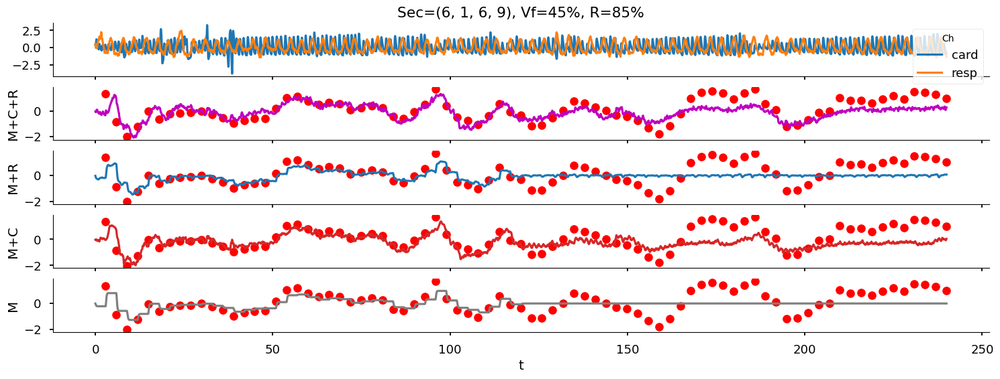

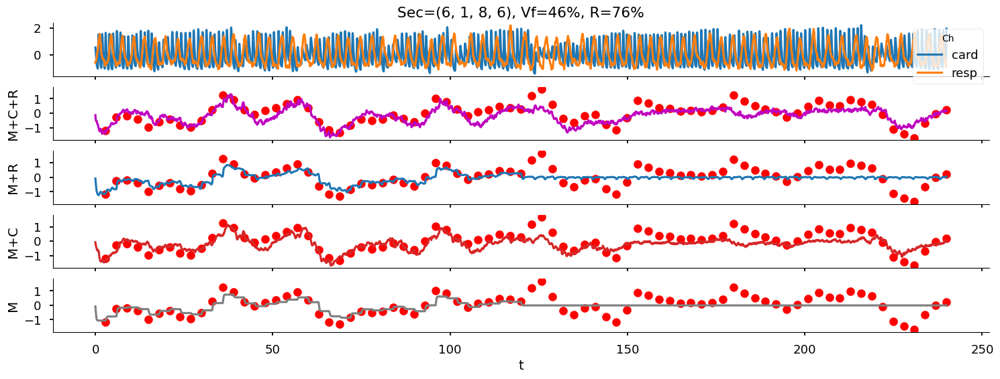

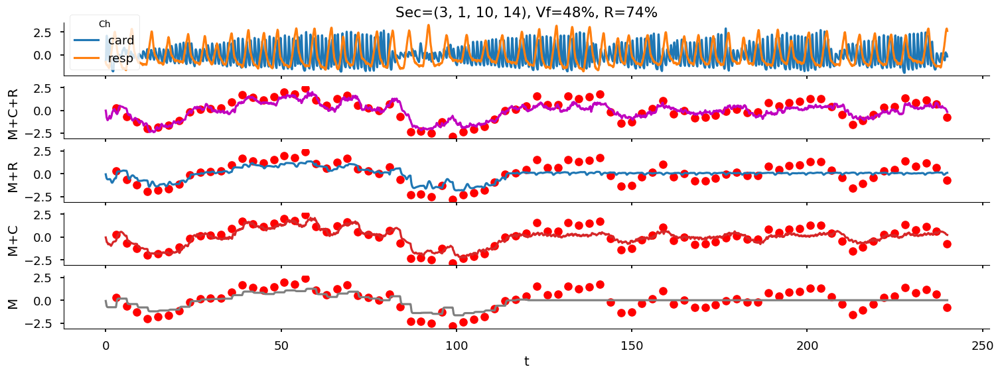

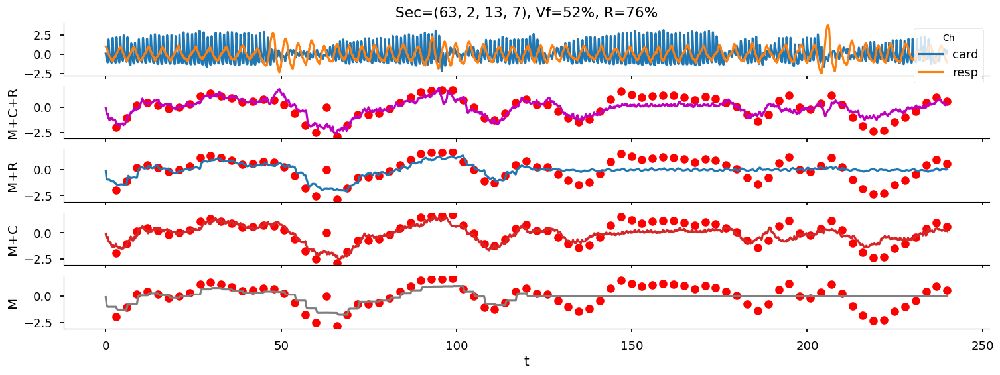

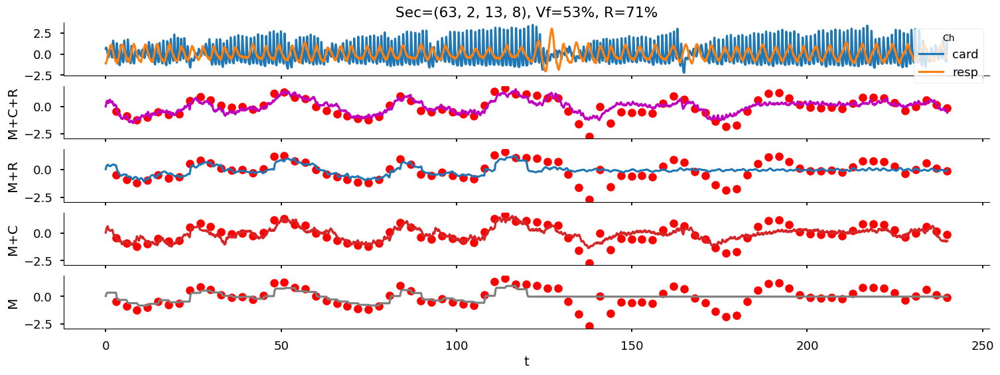

...

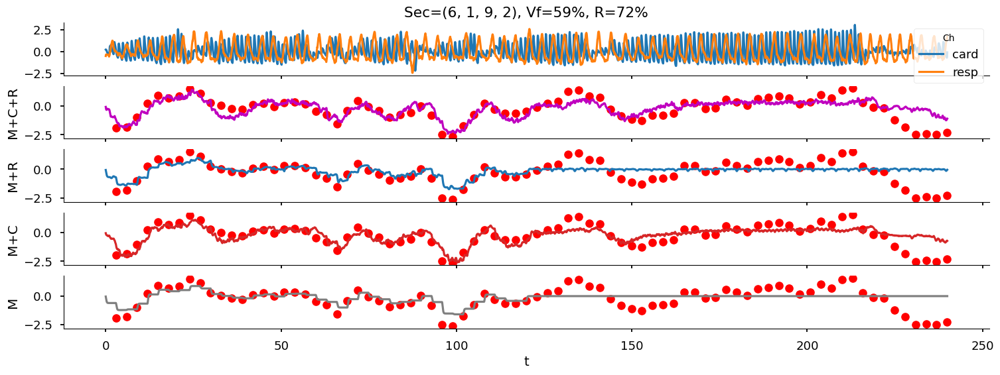

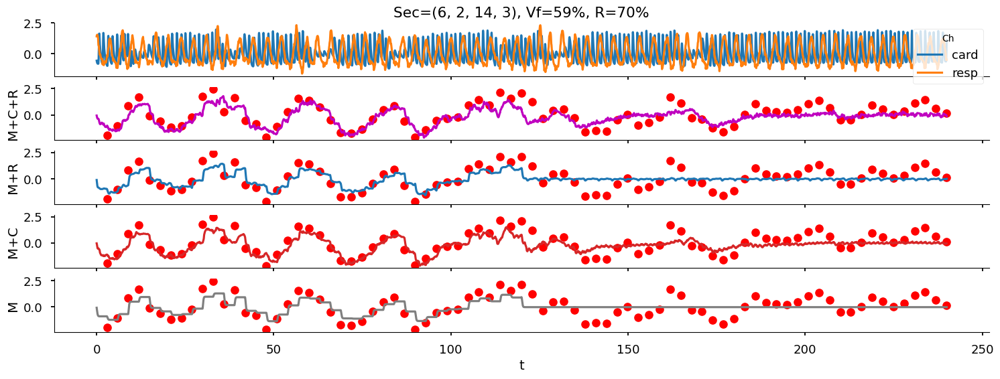

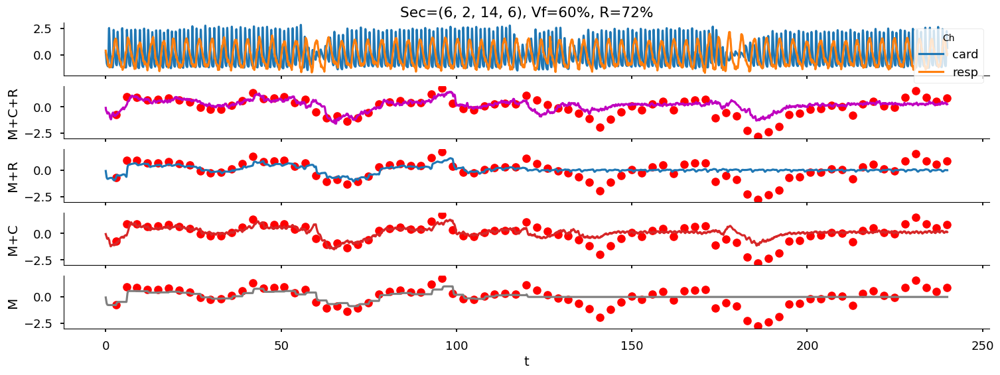

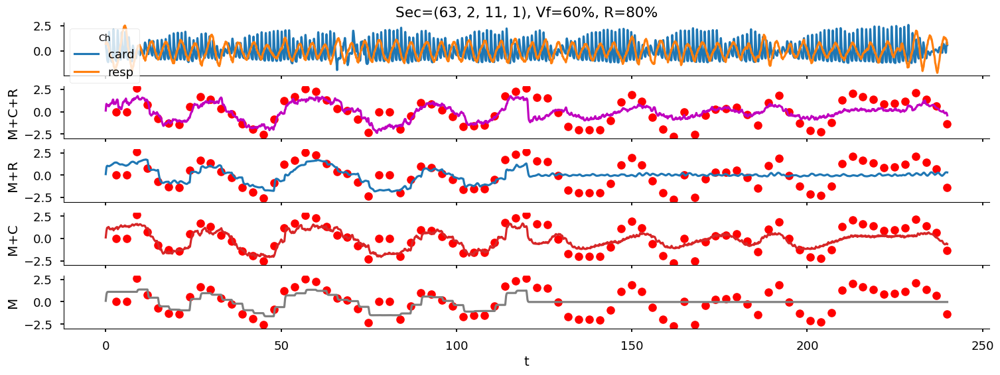

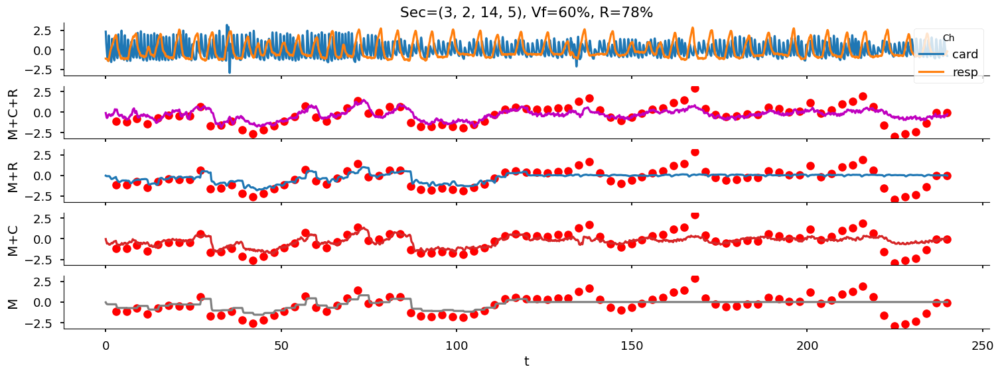

In [37]:
### Fig: Top WRVFz overall
tmp = tmp.sortby('WRVFz')
hFigXn03(tmp[:,:16,...])
# hFigXn03dif(tmp[:,:3,...])
# hFigXn03dif(tmp.isel(Sec=tmp.Clipped==False)[:,:3,...]) # OK!


Su0Vs1Xn_Su003WRVFz00_FigXn.png
Su0Vs1Xn_Su003WRVFz01_FigXn.png
Su0Vs1Xn_Su003WRVFz02_FigXn.png
Su0Vs1Xn_Su006WRVFz00_FigXn.png
Su0Vs1Xn_Su006WRVFz01_FigXn.png
Su0Vs1Xn_Su006WRVFz02_FigXn.png
Su0Vs1Xn_Su056WRVFz00_FigXn.png
Su0Vs1Xn_Su056WRVFz01_FigXn.png
Su0Vs1Xn_Su056WRVFz02_FigXn.png
Su0Vs1Xn_Su063WRVFz00_FigXn.png
Su0Vs1Xn_Su063WRVFz01_FigXn.png
Su0Vs1Xn_Su063WRVFz02_FigXn.png
Su0Vs1Xn_Su065WRVFz00_FigXn.png
Su0Vs1Xn_Su065WRVFz01_FigXn.png
Su0Vs1Xn_Su065WRVFz02_FigXn.png
Su0Vs1Xn_Su078WRVFz00_FigXn.png
Su0Vs1Xn_Su078WRVFz01_FigXn.png
Su0Vs1Xn_Su078WRVFz02_FigXn.png
Su0Vs1Xn_Su086WRVFz00_FigXn.png
Su0Vs1Xn_Su086WRVFz01_FigXn.png


   /usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:4


Su0Vs1Xn_Su086WRVFz02_FigXn.png
Su0Vs1Xn_Su105WRVFz00_FigXn.png
Su0Vs1Xn_Su105WRVFz01_FigXn.png
Su0Vs1Xn_Su105WRVFz02_FigXn.png


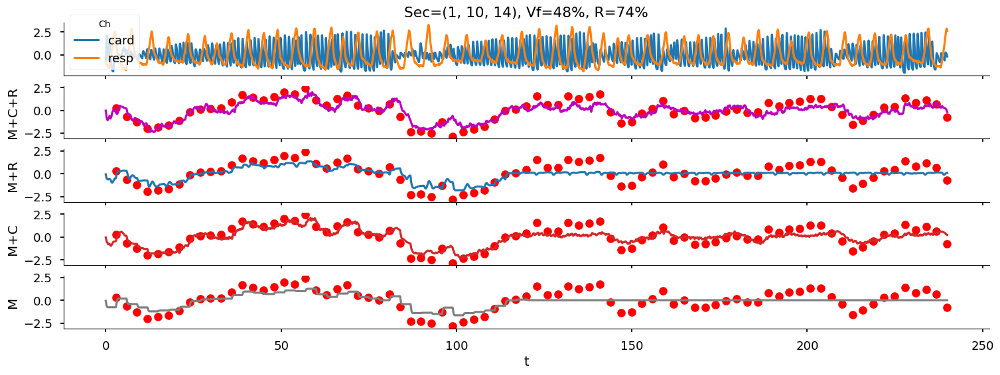

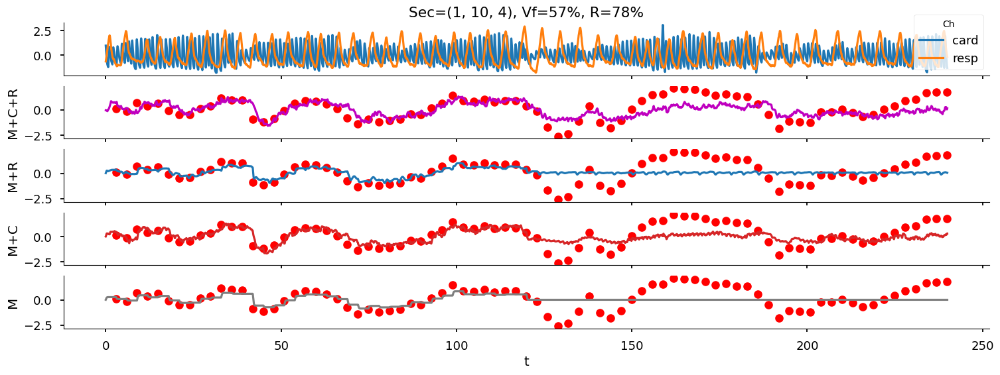

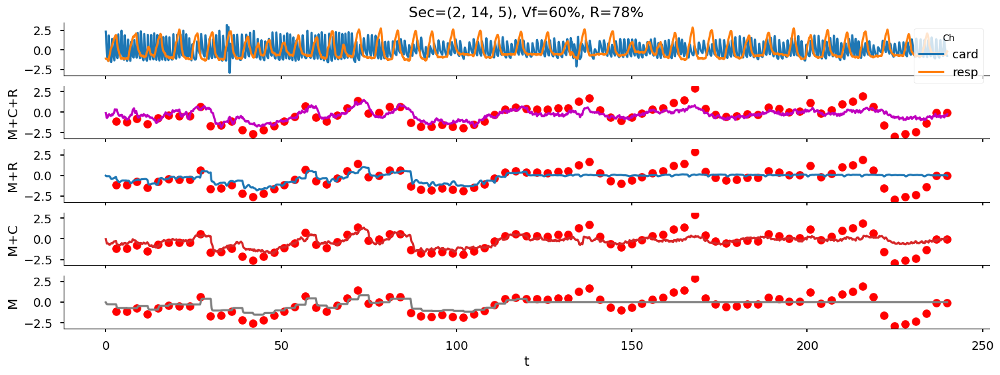

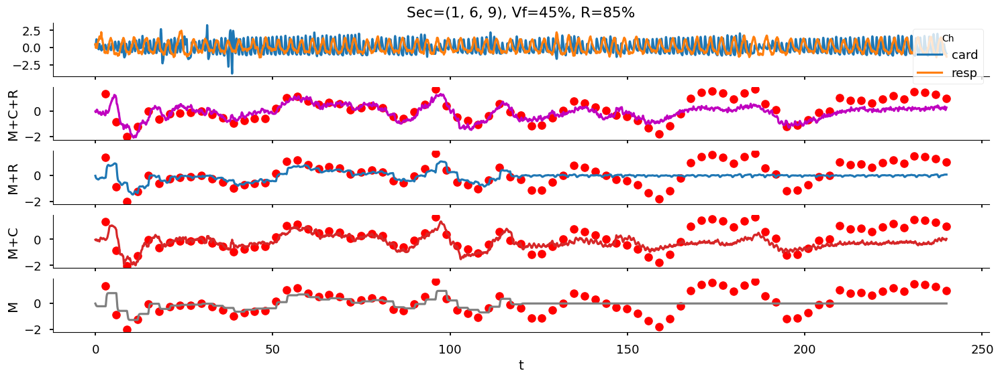

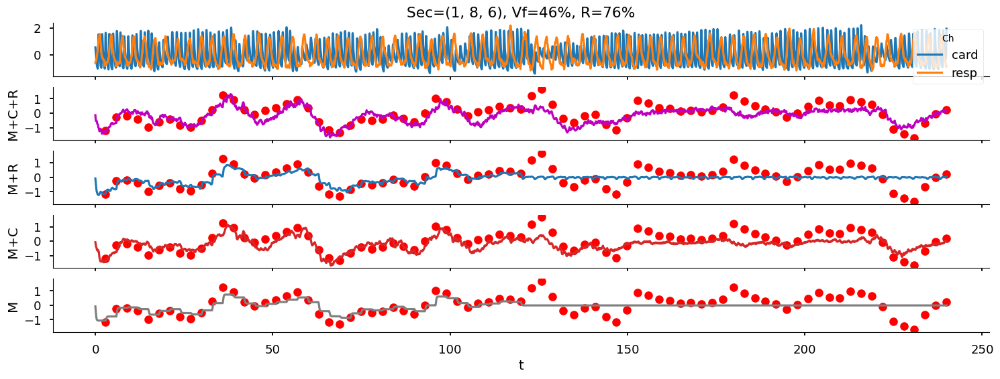

...

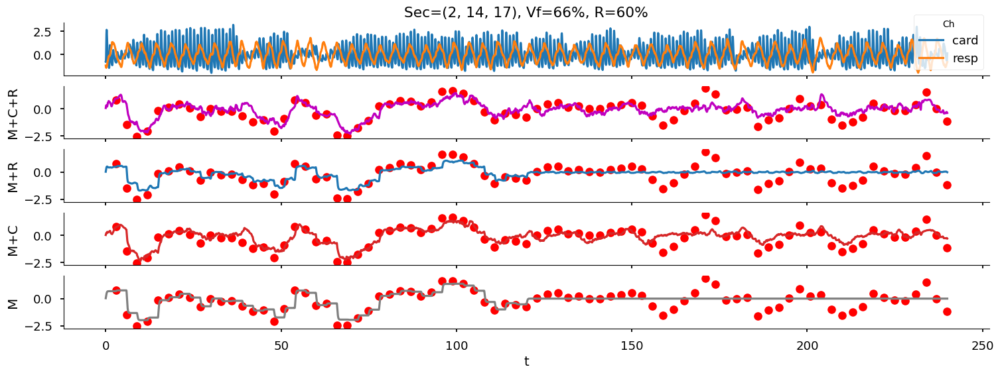

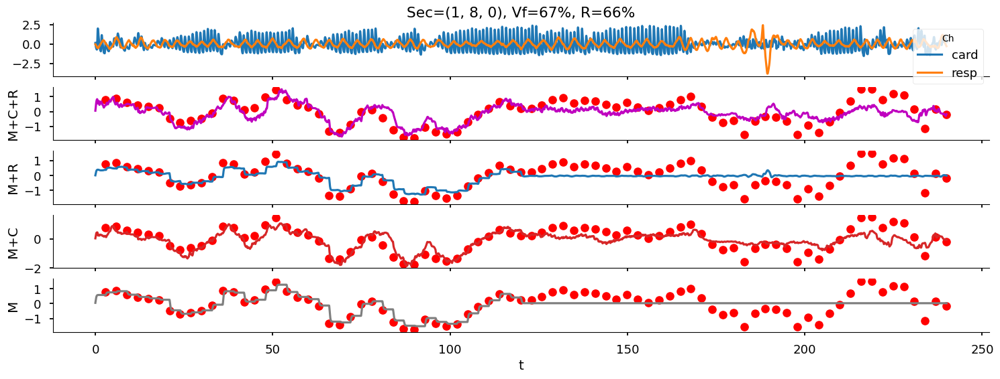

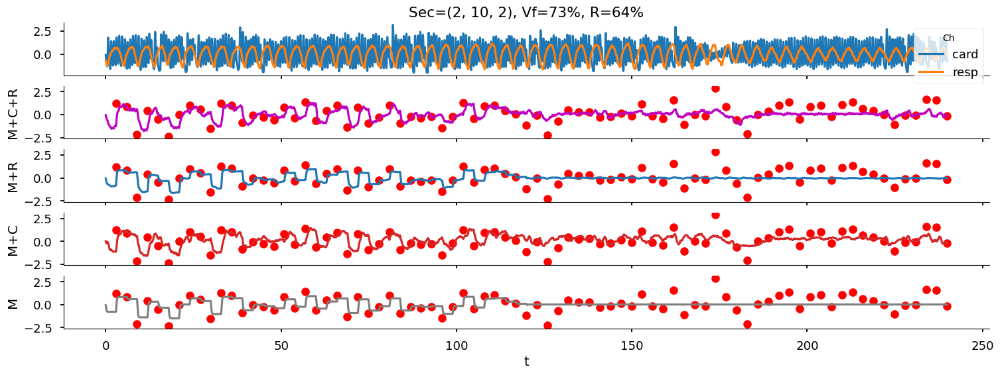

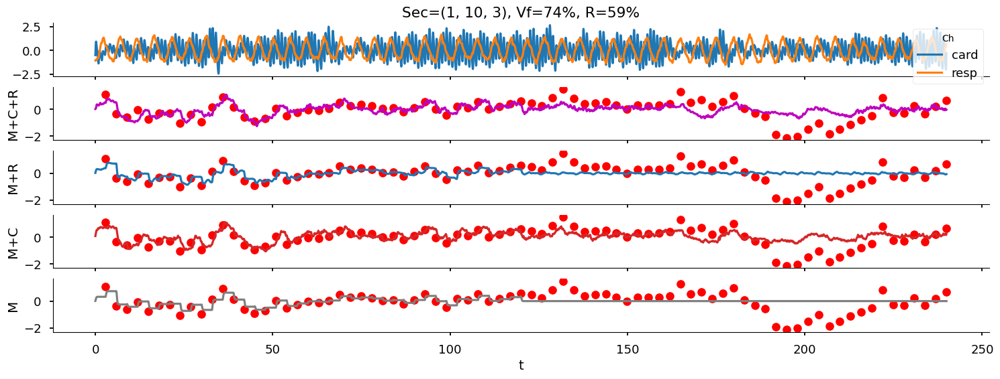

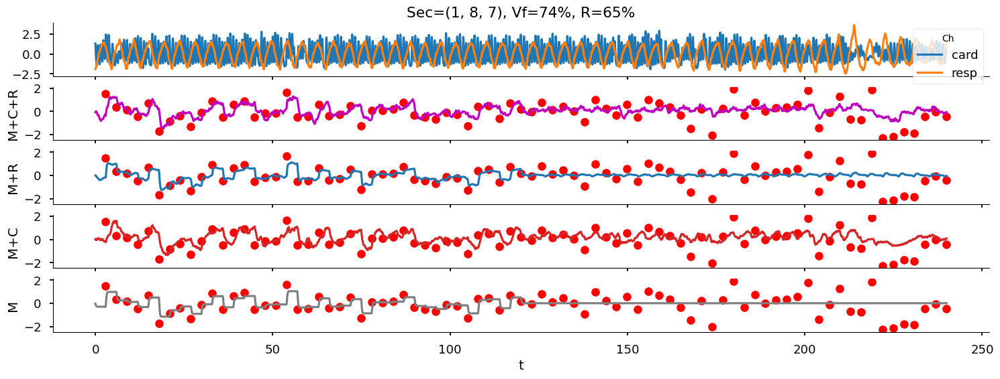

In [38]:
### Fig: Top WRVFz for each Su
tmp = tmp.sortby('WRVFz')
for n in np.unique(tmp.Su):
    for m in range(3):
        if True:
            hFigXn03(tmp.sel(Su=n)[:,m:m+1,...])
            N = ProcId+'_Su%03uWRVFz%02u_FigXn.png'%(n,m)
        else:
            hFigXn03dif(tmp.sel(Su=n)[:,:1,...])
            N = ProcId+'_Su%03uWRVFz%02u_FigXnDif.png'%(n,m)
        print(N)
        # hsavefig(N)


----------------------------------------------
### Old: Take 1

----------------------------------------------
### Old Fig : XnDif

-----------------------------------------------------